# Import and Setup

In [1]:
import datetime as dt
import pandas as pd
import numpy as np
import sys
import matplotlib

import matplotlib.pyplot as plt
plt.style.use('../../style.mplstyle')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

sys.path.insert(0, '../../../purity-monitor/')
sys.path.insert(0, '../../WaveformAnalysis/')
import Dataset as Dataset
import StandMonitor as Monitor
import PlotFunctions as Plt
import importlib
importlib.reload(Dataset)
importlib.reload(Monitor)
importlib.reload(Plt)

<module 'PlotFunctions' from '../../WaveformAnalysis\\PlotFunctions.py'>

# Data Read-In

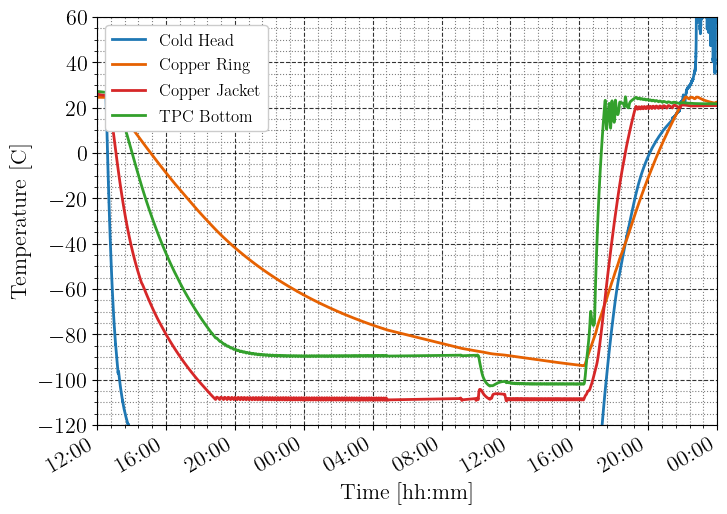

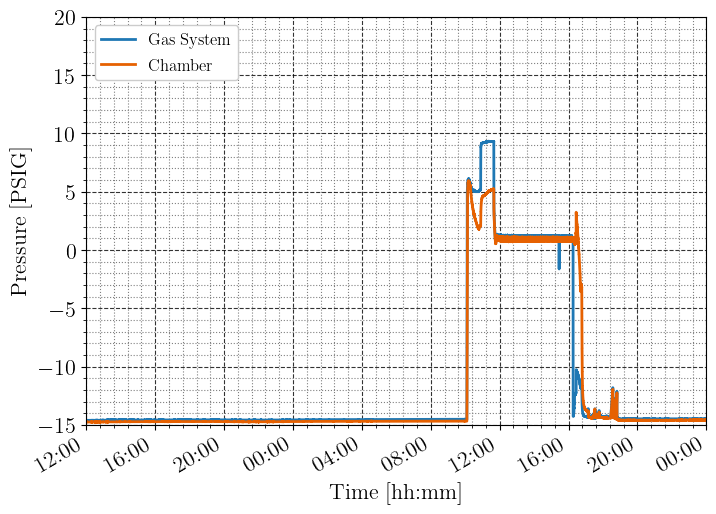

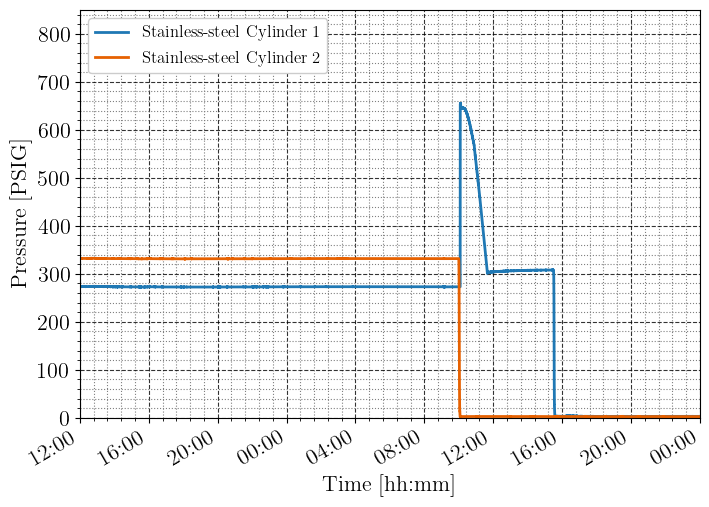

In [2]:
Sensors = []
Files = ['C:/Data/StandStatus/20210602.h5', 'C:/Data/StandStatus/20210603.h5']
for File in Files: 
    Sensor = Monitor.SensorData(Filepath=File)
    Sensor.GetData()
    Sensors.append(Sensor)

AllSensors = Monitor.SensorData()
AllSensors.Combine(Sensors)
XRange = [dt.datetime(2021,6,2,12,0), dt.datetime(2021,6,4,0,0)]
 
AllSensors.PlotData(Data=AllSensors.Temp, Selection='Temperature', XTicks=240, YTicks=20, XRange=XRange, YRange=[-120,60])
AllSensors.PlotData(Data=AllSensors.SPressure, Selection='System Pressure', XTicks=240, YTicks=5, XRange=XRange, YRange=[-15,20])
AllSensors.PlotData(Data=AllSensors.XPressure, Selection='Xenon Pressure', XTicks=240, YTicks=100, XRange=XRange, YRange=[0,850])

Charge Collection [%]: 98.70 +- 1.05
Drift time [us]: 29.40
Electron lifetime [us]: 1231.05  - 11723.14


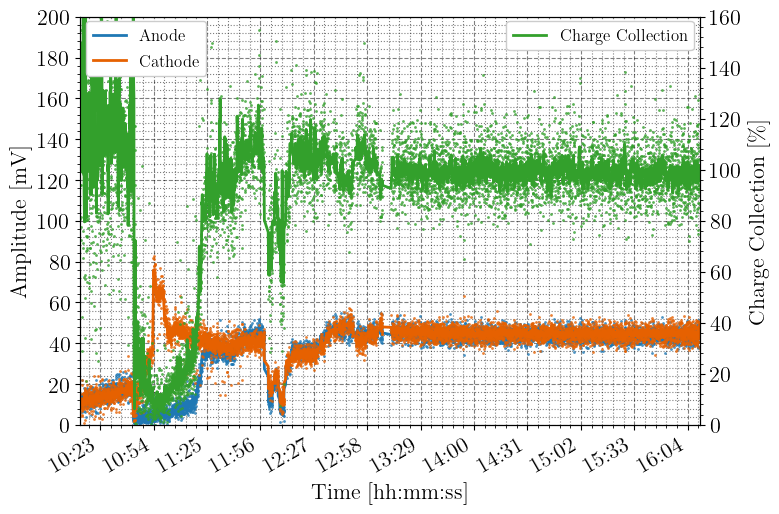

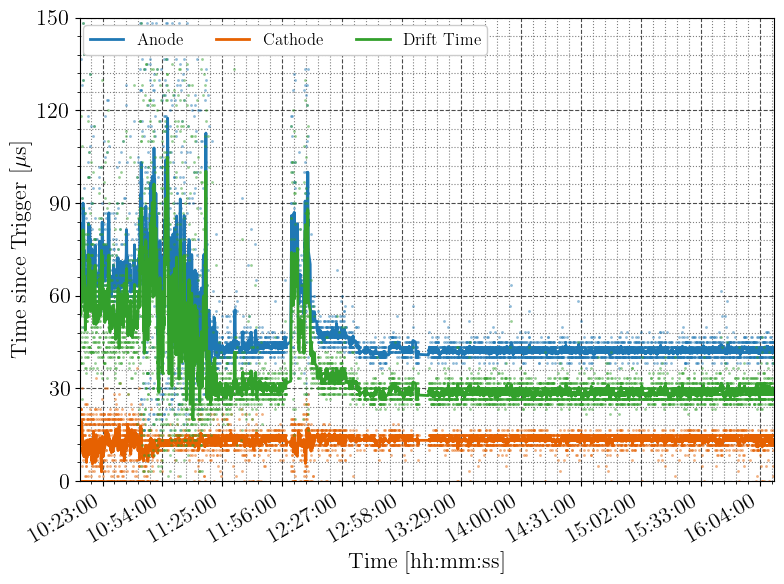

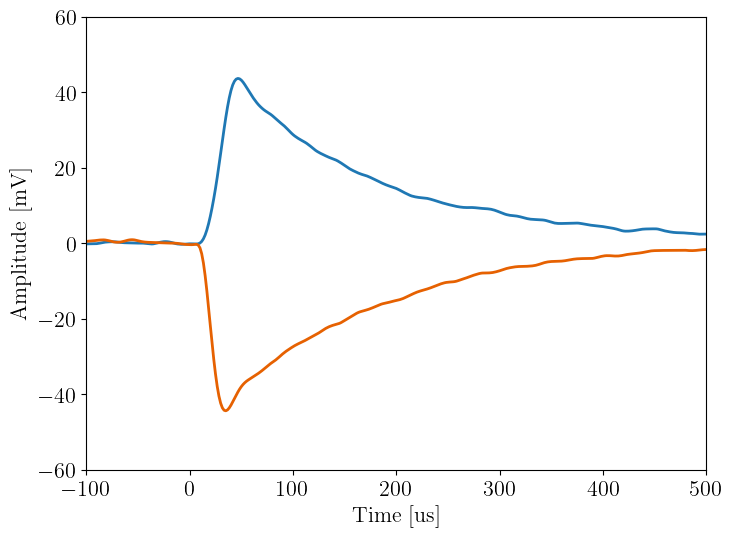

In [3]:
D1 = Dataset.Dataset(Path='C:/Data/20210603/', Selection='*.h5')
D1.RunStandardAnalysis(NoiseDataset=None)
D1.ShowAmplitudeVsTime(YTicks=20, YMax=200)
plt.savefig('20210603_cc.png')
D1.ShowDrifttimeVsTime()

cc = np.mean(D1.ChargeCollection[-100:])
cc_err = np.std(D1.ChargeCollection[-100:])/np.sqrt(len(D1.ChargeCollection[-100:]))
dtime = np.mean(D1.DriftTime[-100:])
lifetime = -dtime/np.log(cc)
lifetime_hi =  -dtime/np.log(cc+cc_err)
lifetime_lo =  -dtime/np.log(cc-cc_err)
print("Charge Collection [%]: {:.2f} +- {:.2f}".format(cc*100, cc_err*100))
print("Drift time [us]: {:.2f}".format(dtime))
print("Electron lifetime [us]: {:.2f}  - {:.2f}".format(lifetime_lo, lifetime_hi))


plt.figure()
plt.xlabel('Time [us]')
plt.ylabel('Amplitude [mV]')
plt.plot(D1.Ch[0].Time, np.mean(D1.Ch[0].Amp[-50:],axis=0))
plt.plot(D1.Ch[0].Time, np.mean(D1.Ch[1].Amp[-50:],axis=0)*-1)
plt.xlim(-100,500)
plt.show()

Charge Collection [%]: 108.19 +- 0.81
Drift time [us]: 30.17
Electron lifetime [us]: -423.68  - -350.43


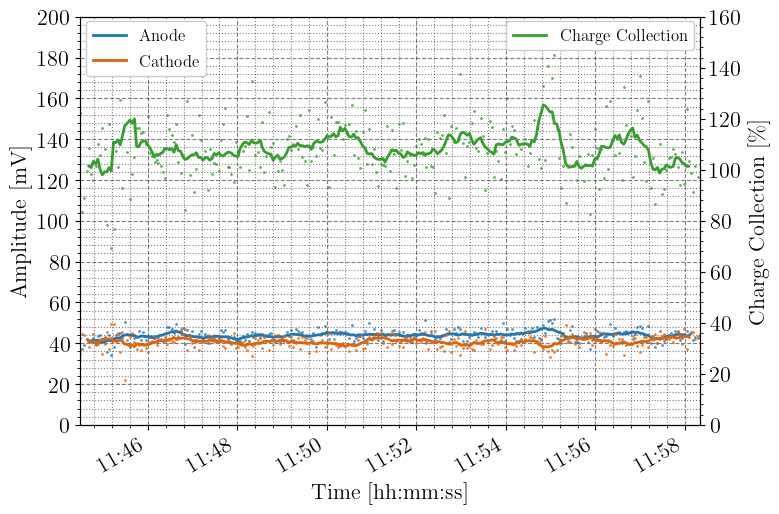

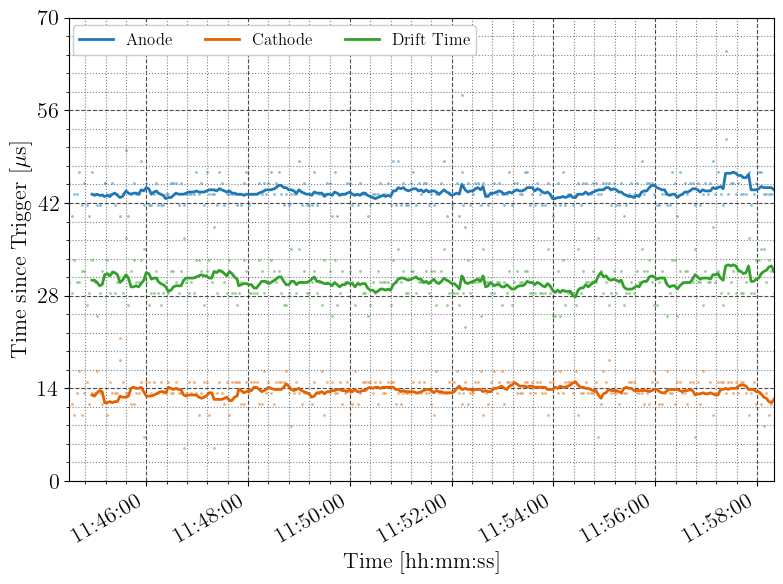

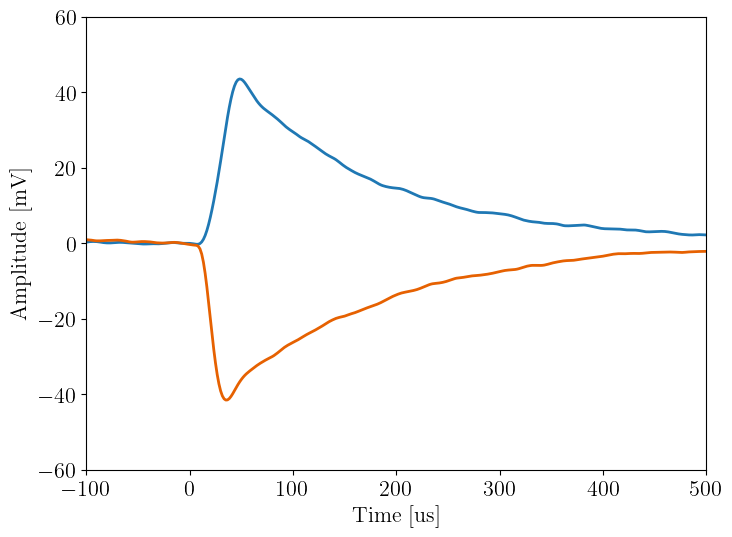

In [4]:
D1 = Dataset.Dataset(Path='C:/Data/20210603/', Selection='Collection*.h5')
D1.RunStandardAnalysis()
D1.ShowAmplitudeVsTime(YTicks=20, YMax=200)
plt.savefig('20210603_cc.png')
D1.ShowDrifttimeVsTime()

cc = np.mean(D1.ChargeCollection)
cc_err = np.std(D1.ChargeCollection)/np.sqrt(len(D1.ChargeCollection))
dtime = np.mean(D1.DriftTime)
dtime_err = np.std(D1.DriftTime)/np.sqrt(len(D1.DriftTime))
lifetime = -dtime/np.log(cc)
lifetime_hi =  -dtime/np.log(cc+cc_err)
lifetime_lo =  -dtime/np.log(cc-cc_err)
print("Charge Collection [%]: {:.2f} +- {:.2f}".format(cc*100, cc_err*100))
print("Drift time [us]: {:.2f}".format(dtime))
print("Electron lifetime [us]: {:.2f}  - {:.2f}".format(lifetime_lo, lifetime_hi))


plt.figure()
plt.xlabel('Time [us]')
plt.ylabel('Amplitude [mV]')
plt.plot(D1.Ch[0].Time, np.mean(D1.Ch[0].Amp[-50:],axis=0))
plt.plot(D1.Ch[0].Time, np.mean(D1.Ch[1].Amp[-50:],axis=0)*-1)
plt.xlim(-100,500)
plt.show()

20 66.7
30 88.26
50 94.03
80 106.26
130 107.75
200 108.4
250 103.79
300 102.25
330 103.25
400 97.96
460 95.19
500 93.94


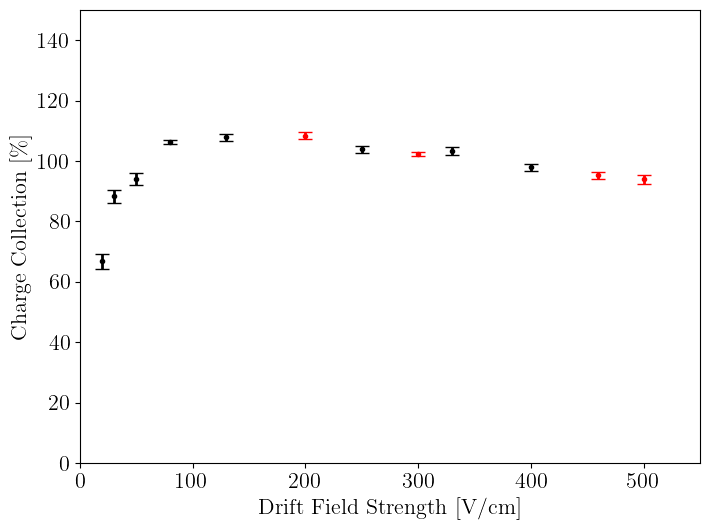

In [28]:
field = [20, 30, 50, 80, 130, 200, 250, 300, 330, 400, 460, 500]
plt.figure()
cc = [] 
cc_err = []
dtime = [] 
for fl in field: 
    color = 'k'
    if fl in [200,300, 460, 500]:
        color = 'r'
    D4 = Dataset.Dataset(Path='C:/Data/20210603/', Selection='FieldDependence_C-{}V*.h5'.format(fl))
    D4.RunStandardAnalysis()
    D4.ShowDrifttimeVsTime()
    plt.close()
    dtime.append(np.mean(D4.DriftTime))
    print(fl, np.round(np.mean(D4.ChargeCollection)*100.0,2))
    cc.append(np.mean(D4.ChargeCollection))
    cc_err.append(np.std(D4.ChargeCollection)/np.sqrt(len(D4.ChargeCollection)))
    plt.errorbar(fl, np.mean(D4.ChargeCollection)*100.0, yerr=np.std(D4.ChargeCollection)/np.sqrt(len(D4.ChargeCollection))*100.0, color=color, marker='o',ms=3)
plt.xlabel('Drift Field Strength [V/cm]')
plt.ylabel('Charge Collection [\%]')
plt.xlim(0,550)
plt.ylim(0,150)
plt.savefig('20210603_field_vs_cc.png')
plt.show()


[20, 30, 50, 80, 130, 200, 250, 300, 330, 400, 460, 500] [ 0.00594706  0.00254138  0.00152789 -0.00179185 -0.00238154 -0.00269641
 -0.00125794 -0.00076783 -0.00112274  0.0007255   0.00176828  0.00226357]


<ErrorbarContainer object of 3 artists>

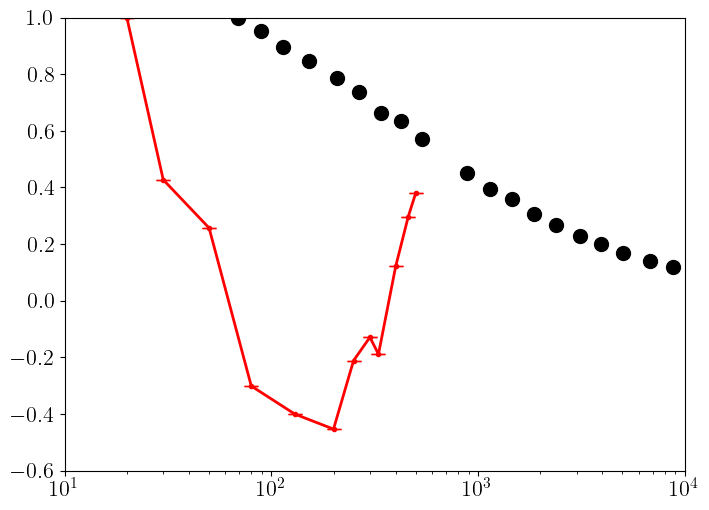

In [29]:
data = pd.read_csv('../../data/electron_attachment.txt', sep=",")
data.columns = ['Electric Field', 'Attachment']
plt.figure()

kappa = -np.log(cc)/np.array(dtime)
print(field, kappa)

plt.xscale('log')
plt.scatter(data['Electric Field'], data['Attachment']/np.max(data['Attachment']), label='Oxygen', color='k')
plt.errorbar(field, kappa/np.max(kappa), yerr=0, color='r', marker='o',ms=3)

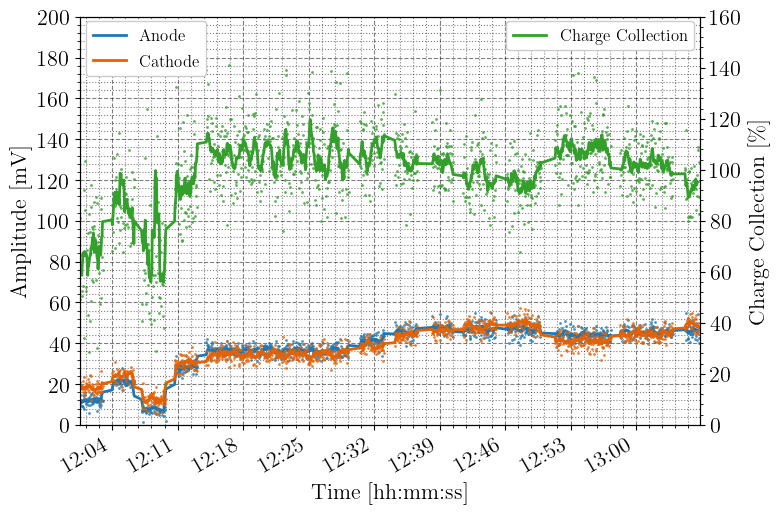

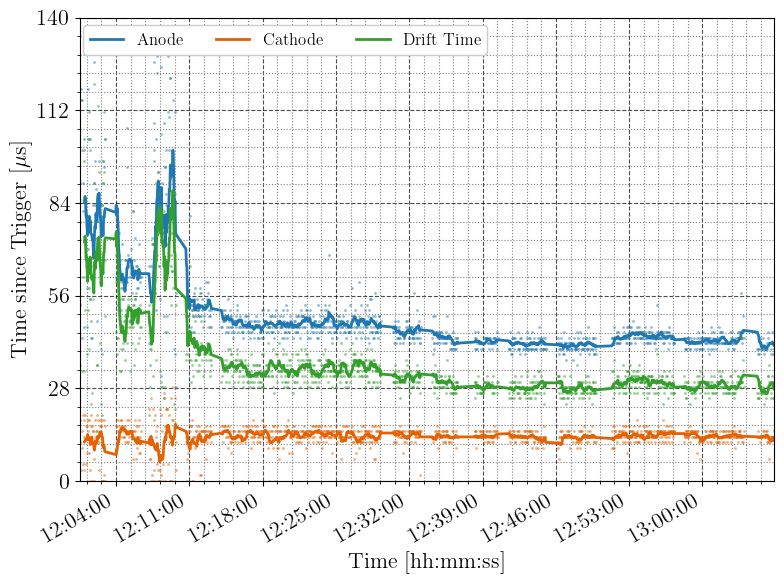

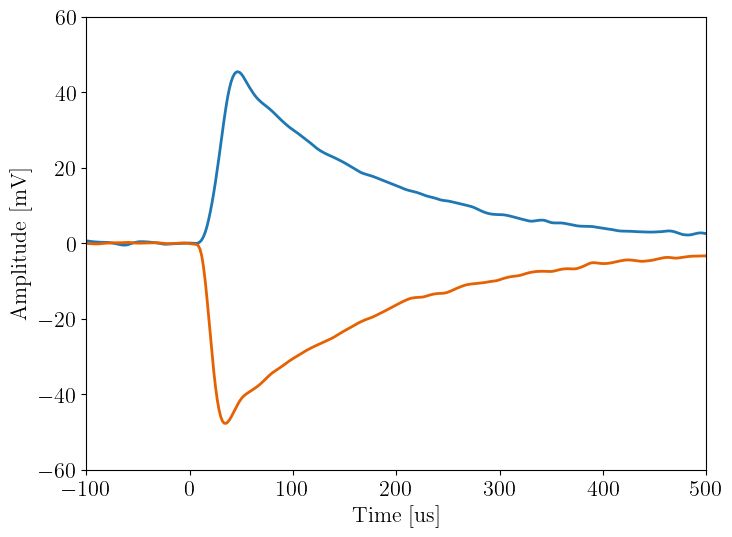

In [7]:
D5 = Dataset.Dataset(Path='C:/Data/20210603/', Selection='FieldDependence*.h5')
D5.RunStandardAnalysis()
D5.ShowAmplitudeVsTime(YTicks=20, YMax=200)
# plt.savefig('20210603_cc.png')
D5.ShowDrifttimeVsTime()

# cc = np.mean(D5.ChargeCollection)
# cc_err = np.std(D1.ChargeCollection)/np.sqrt(len(D1.ChargeCollection))
# dtime = np.mean(D1.DriftTime)
# dtime_err = np.std(D1.DriftTime)/np.sqrt(len(D1.DriftTime))
# lifetime = -dtime/np.log(cc)
# lifetime_hi =  -dtime/np.log(cc+cc_err)
# lifetime_lo =  -dtime/np.log(cc-cc_err)
# print("Charge Collection [%]: {:.2f} +- {:.2f}".format(cc*100, cc_err*100))
# print("Drift time [us]: {:.2f}".format(dtime))
# print("Electron lifetime [us]: {:.2f}  - {:.2f}".format(lifetime_lo, lifetime_hi))


plt.figure()
plt.xlabel('Time [us]')
plt.ylabel('Amplitude [mV]')
plt.plot(D5.Ch[0].Time, np.mean(D5.Ch[0].Amp[-50:],axis=0))
plt.plot(D5.Ch[0].Time, np.mean(D5.Ch[1].Amp[-50:],axis=0)*-1)
plt.xlim(-100,500)
plt.show()

Charge Collection [%]: 99.08 +- 0.81
Drift time [us]: 30.17
Electron lifetime [us]: 1728.92  - 25240.60


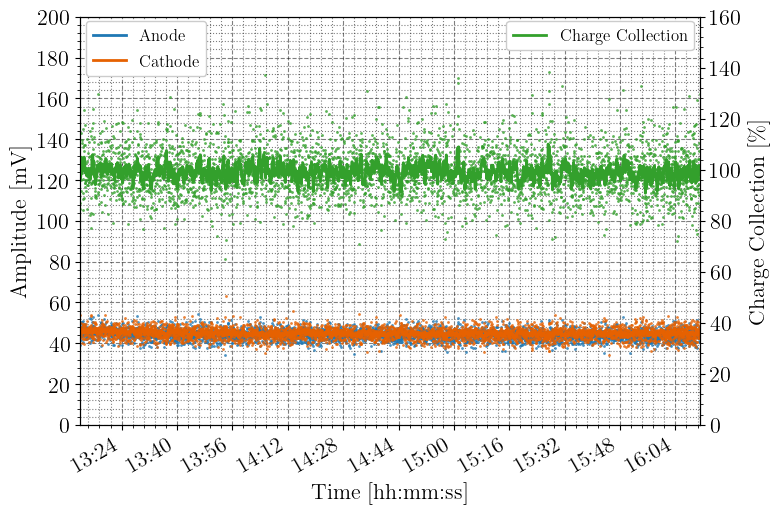

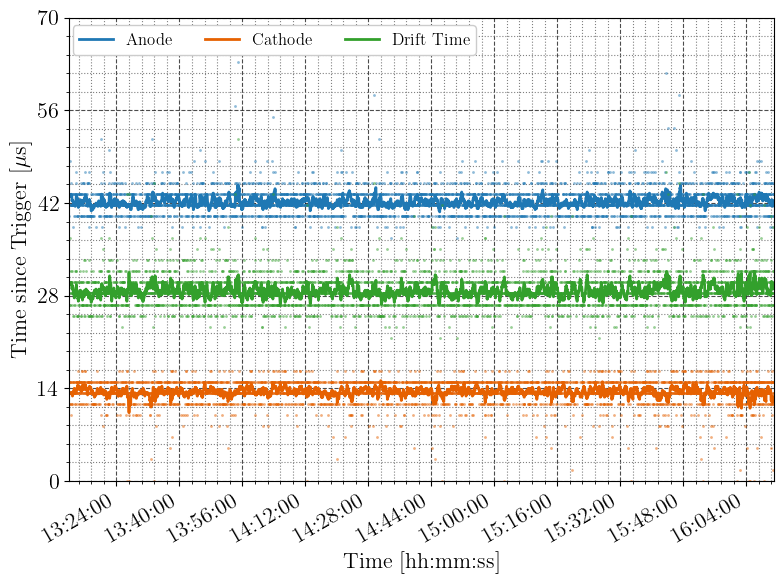

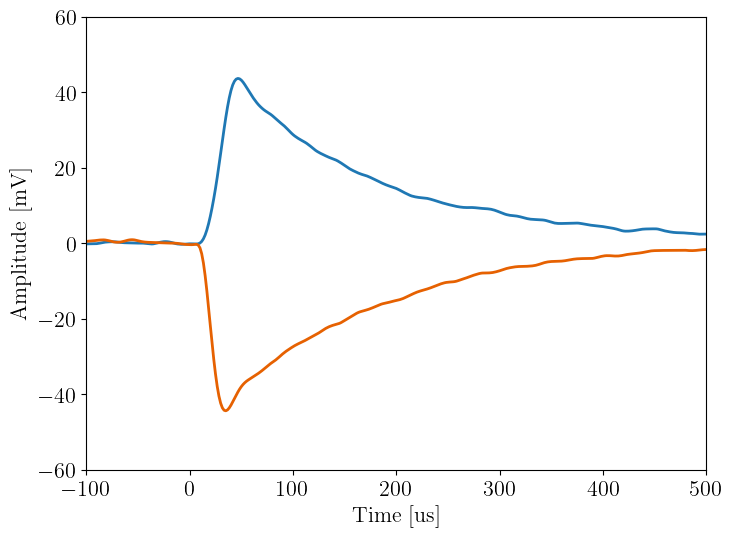

In [8]:
D6 = Dataset.Dataset(Path='C:/Data/20210603/', Selection='Outdiffusion*.h5')
D6.RunStandardAnalysis()
D6.ShowAmplitudeVsTime(YTicks=20, YMax=200)
# plt.savefig('20210603_cc.png')
D6.ShowDrifttimeVsTime()

cc = np.mean(D5.ChargeCollection)
cc_err = np.std(D1.ChargeCollection)/np.sqrt(len(D1.ChargeCollection))
dtime = np.mean(D1.DriftTime)
dtime_err = np.std(D1.DriftTime)/np.sqrt(len(D1.DriftTime))
lifetime = -dtime/np.log(cc)
lifetime_hi =  -dtime/np.log(cc+cc_err)
lifetime_lo =  -dtime/np.log(cc-cc_err)
print("Charge Collection [%]: {:.2f} +- {:.2f}".format(cc*100, cc_err*100))
print("Drift time [us]: {:.2f}".format(dtime))
print("Electron lifetime [us]: {:.2f}  - {:.2f}".format(lifetime_lo, lifetime_hi))


plt.figure()
plt.xlabel('Time [us]')
plt.ylabel('Amplitude [mV]')
plt.plot(D6.Ch[0].Time, np.mean(D6.Ch[0].Amp[-50:],axis=0))
plt.plot(D6.Ch[0].Time, np.mean(D6.Ch[1].Amp[-50:],axis=0)*-1)
plt.xlim(-100,500)
plt.show()

0.9629702123091465 0.0009563303329265089
0.08492482232044939
Charge Collection [%]: 96.30 +- 8.49
Drift time [us]: 28.75
Electron lifetime [us]: 221.05  - -614.51


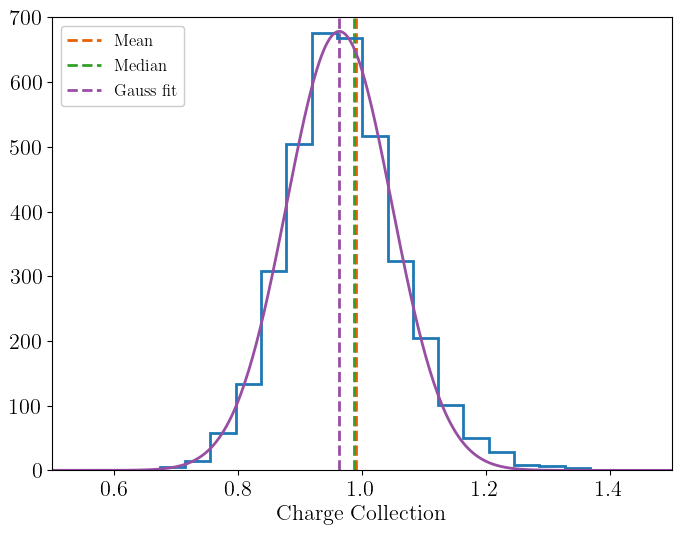

In [21]:
from scipy.optimize import curve_fit

def gauss(x,a,b,c):
    return a*np.exp(-(x-b)**2/(2*c**2))

plt.figure()
plt.xlabel('Charge Collection')
plt.xlim(0.5,1.5)
hist = plt.hist(D6.ChargeCollection, bins=np.linspace(0,2,50), histtype='step', lw=2, align='left')
plt.vlines(x=np.mean(D6.ChargeCollection), ymin=0, ymax=700, color=colors[1], ls='--', label='Mean')
plt.vlines(x=np.median(D6.ChargeCollection), ymin=0, ymax=700, color=colors[2], ls='--', label='Median')

popt,pcov = curve_fit(gauss, hist[1][:-1], hist[0])
xfit = np.linspace(0,2,1000)
plt.plot(xfit, gauss(xfit, *popt), color=colors[3])

plt.vlines(x=popt[1], ymin=0, ymax=700, color=colors[3], ls='--', label='Gauss fit')
err = np.sqrt(np.diag(pcov)) 

print(popt[1], err[1])
print(popt[2])

cc = popt[1]
cc_err = popt[2]
dtime = np.mean(D6.DriftTime)
lifetime = -dtime/np.log(cc)
lifetime_hi =  -dtime/np.log(cc+cc_err)
lifetime_lo =  -dtime/np.log(cc-cc_err)
print("Charge Collection [%]: {:.2f} +- {:.2f}".format(cc*100, cc_err*100))
print("Drift time [us]: {:.2f}".format(dtime))
print("Electron lifetime mean [us]: {:.2f}".format(lifetime))
print("Electron lifetime range [us]: {:.2f}  - {:.2f}".format(lifetime_lo, lifetime_hi))

plt.legend(loc='upper left')
plt.show()

In [9]:
delta = dt.datetime(2021,6,3,0,0) - dt.datetime(2021,5,17,0,0)
capdata_last = pd.read_csv("C:/Data/LevelMeter/20210517_liquefaction_11.csv", names=['Time', 'Level'])
timestamp_last = np.array([dt.datetime.strptime(x, "%m/%d/%Y %I:%M:%S %p") + delta for x in capdata_last['Time']])
cap_last = np.array(capdata_last['Level'])

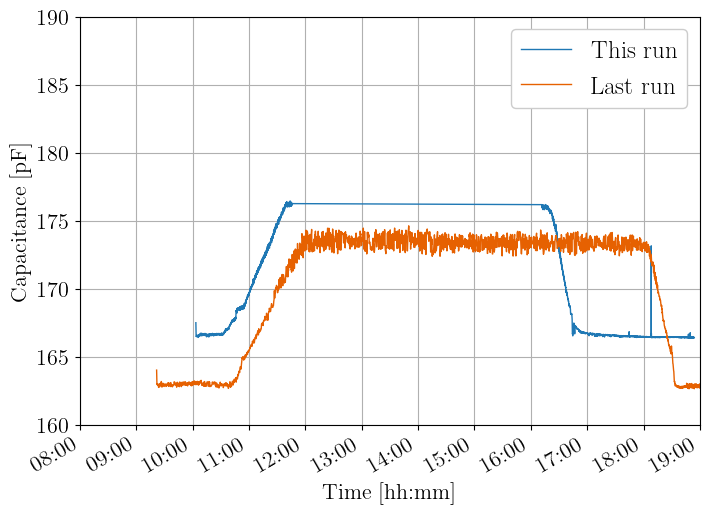

In [10]:
capdata = pd.read_csv("C:/Data/LevelMeter/20210603_liquefaction_12.csv", names=['Time', 'Level'])
timestamp = np.array([dt.datetime.strptime(x, "%m/%d/%Y %I:%M:%S %p") for x in capdata['Time']])
cap = np.array(capdata['Level'])
formatter = matplotlib.dates.DateFormatter('%H:%M')

fig = plt.figure()
ax = fig.gca()

XRange = [dt.datetime(2021,6,3,8,0), dt.datetime(2021,6,3,19,0)]

plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
plt.gcf().autofmt_xdate()
plt.grid()
plt.xlabel('Time [hh:mm]')
plt.ylabel('Capacitance [pF]')

plt.xlim(XRange[0], XRange[1])
ax.xaxis.set_major_locator(matplotlib.dates.MinuteLocator(interval=60))

cut = np.where((timestamp>XRange[0]) & (cap>0) & (cap<300))
plt.plot(timestamp[cut][::10], cap[cut][::10], lw=1, label='This run')

cut_last = np.where((timestamp_last>XRange[0]) & (cap_last>0))
plt.plot(timestamp_last[cut_last][::10], cap_last[cut_last][::10], lw=1, label='Last run')
             
plt.ylim(160,190)
plt.legend(loc='upper right', fontsize=18)
plt.show() 